In [1]:
import warnings

warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

In [2]:
import json
import os

#import matplotlib.pyplot as plt
#import numpy as np
#import scanpy as sc
#import seaborn as sns

In [3]:
import spatialdata_plot

In [4]:
import datetime

date_var = datetime.datetime.now().strftime("%Y%m%d")

In [5]:
import spatialdata as sd

In [6]:
data_dir = os.path.abspath("/home/data")
!ls -l $data_dir

lrwxrwxrwx 1 ra98gaq pn52ra 53 Mar 12 17:01 /home/data -> /dss/dssfs03/pn52re/pn52re-dss-0001/cellseg-benchmark


In [7]:
sample_name = "foxf2_s2_r1"

# Functions

In [8]:
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import matplotlib as mpl
colors_dapi = [(0, 0, 0), (0, 0, 1)]  # Black to blue
blue_cmap = LinearSegmentedColormap.from_list('custom_blue', colors_dapi)

In [9]:
def visualize_spatial_data(sdata_sub, bounds, cell_types_mouse_brain, colors, dotsize, 
                          data_dir, sample_name, date_var, vname, 
                          cmap=blue_cmap, show_in_notebook=True):
    """
    Visualize spatial data with cell markers on DAPI background.
    Saves to disk and optionally displays in notebook.
    """
    output_dir = os.path.join(data_dir, "samples", sample_name, "plots")
    os.makedirs(output_dir, exist_ok=True)
    
    style_settings = {
        'axes.spines.top': False, 'axes.spines.right': False,
        'axes.spines.bottom': False, 'axes.spines.left': False,
        'xtick.bottom': False, 'xtick.labelbottom': False,
        'ytick.left': False, 'ytick.labelleft': False
    }
    
    with plt.style.context('dark_background'), mpl.rc_context(style_settings):
        for bound in bounds:
            plot = (sdata_sub.pl.render_images(element='foxf2_s2_r1_z3', channel="DAPI", cmap=cmap)
                   .pl.render_shapes(element=bound, outline_width=0.7, outline_alpha=0.7,
                                     outline_color="white", color="white", fill_alpha=0.1))
            
            # Add markers for each cell type
            for cell_type, markers in cell_types_mouse_brain.items():
                for marker in markers:
                    plot = plot.pl.render_points("foxf2_s2_r1_transcripts", color="gene", 
                                                 groups=marker, palette=colors[cell_type], size=dotsize)
            
            plot.pl.show(figsize=(18, 10))
            boundary_name = bound.split('boundaries_')[1]
            plt.savefig(os.path.join(output_dir, f"{date_var}_{vname}_{boundary_name}.png"),
                        dpi=500, bbox_inches='tight', pad_inches=0.2, transparent=False)
            
            if not show_in_notebook:
                plt.close()

In [10]:
cell_types_mouse_brain = {
'ECs':['Cldn5', 'Cdh5', 'Pecam1', 'Kdr', 'Nos3'],
'Pericytes':['Vtn', 'Kcnj8', 'Rgs5', 'Atp13a5', 'Anpep'],
'SMCs':['Acta2', 'Pdlim3', 'Tagln', 'Myh11', 'Adamts1'],
'Fibroblasts':['Dcn', 'Col1a1', 'Lama1', 'Slc7a11', 'Slc6a13'],
}
#colors = {
#    "ECs": "#7CEC37",
#    "Pericytes": "#FDF778",
#    "SMCs": "#FF6464",
#    "Fibroblasts": "#43BCE7"
#}
colors = {
    "ECs": "#FF6464",
    "Pericytes": "#FFE62E",
    "SMCs": "#29FBA7",
    "Fibroblasts": "#85B0F9"
}

In [11]:
cell_types_mouse_brain_all = {
'ECs':['Cldn5', 'Cdh5', 'Pecam1', 'Kdr', 'Nos3'],
'Pericytes':['Vtn', 'Kcnj8', 'Rgs5', 'Atp13a5', 'Anpep'],
'SMCs':['Acta2', 'Pdlim3', 'Tagln', 'Myh11', 'Adamts1'],
'Fibroblasts':['Dcn', 'Col1a1', 'Lama1', 'Slc7a11', 'Slc6a13'],
'Astrocytes':['Aqp4','Slc1a3','Plpp3','Clu','Apoe'],
'Choroid Plexus':['Foxj1','Pifo','Tmem212','Ccdc153'],
'Oligodendrocytes':['Apod','Mag','Enpp2','Cnp','Cldn11'],
'OPCs':['Olig2','Cspg5','Ptprz1','Pdgfra','Sox10'],
'Microglia/Macrophages':['Aif1','C1qa','C1qc','Itgax','Ctss'],
'Neurons':['Rbfox3','Meg3','Gad1','Slc32a1','Slc17a7']
#'':['','','','',''],
#'':['','','','','']
}
colors_all = {
    "ECs": "#FF6464",
    "Pericytes": "#FFE62E",
    "SMCs": "#29FBA7",
    "Fibroblasts": "#85B0F9",
    "Astrocytes":"#FE9A30",
    "Choroid Plexus":"#D2C800",
    "Oligodendrocytes":"#4564FF",
    "OPCs":"#2024FF",
    "Microglia/Macrophages":"#21EFA5",
    "Neurons":"#CEB3FF"
}

# Load sdata

In [12]:
sdata_path = os.path.join(data_dir, "samples", sample_name, "sdata_z3.zarr")
if "sdata" not in locals():
    sdata = sd.read_zarr(sdata_path)

In [13]:
sdata

SpatialData object, with associated Zarr store: /dss/dssfs03/pn52re/pn52re-dss-0001/cellseg-benchmark/samples/foxf2_s2_r1/sdata_z3.zarr
├── Images
│     └── 'foxf2_s2_r1_z3': DataTree[cyx] (8, 54456, 65675), (8, 27228, 32837), (8, 13614, 16418), (8, 6807, 8209), (8, 3403, 4104)
├── Points
│     └── 'foxf2_s2_r1_transcripts': DataFrame with shape: (<Delayed>, 9) (2D points)
├── Shapes
│     ├── 'boundaries_Baysor_2D_CP1Merlin_075': GeoDataFrame shape: (124658, 1) (2D shapes)
│     ├── 'boundaries_Baysor_2D_CP1_020': GeoDataFrame shape: (145848, 1) (2D shapes)
│     ├── 'boundaries_Baysor_2D_CP1_080': GeoDataFrame shape: (133435, 1) (2D shapes)
│     ├── 'boundaries_Baysor_2D_CP2_020': GeoDataFrame shape: (148669, 1) (2D shapes)
│     ├── 'boundaries_Baysor_2D_CP2_080': GeoDataFrame shape: (128401, 1) (2D shapes)
│     ├── 'boundaries_Baysor_2D_nucleus_100': GeoDataFrame shape: (147154, 1) (2D shapes)
│     ├── 'boundaries_Baysor_3D': GeoDataFrame shape: (149500, 1) (2D shapes)
│     ├──

In [15]:
# optional: add ficture factors

In [17]:
ficture_sdata_file = os.path.join(
    data_dir, "samples", sample_name, "results", "Ficture", "sdata.zarr"
)
ficture_sdata = sd.read_zarr(ficture_sdata_file)

In [ ]:
factor = "nF21"

In [ ]:
cropped_sdata.pl.render_points(
    f"{sample_name}_all_transcript_factors",
    color=f"{factor}_factors",
    cmap=cmap,
    method="matplotlib",
    alpha=0.5,
    size=0.1,
)

# Plot

In [14]:
bound_keys = list(sdata.shapes.keys())
bound_keys

['boundaries_Baysor_2D_CP1Merlin_075',
 'boundaries_Baysor_2D_CP1_020',
 'boundaries_Baysor_2D_CP1_080',
 'boundaries_Baysor_2D_CP2_020',
 'boundaries_Baysor_2D_CP2_080',
 'boundaries_Baysor_2D_nucleus_100',
 'boundaries_Baysor_3D',
 'boundaries_Cellpose_1_DAPI_PolyT',
 'boundaries_Cellpose_1_DAPI_Transcripts',
 'boundaries_Cellpose_1_Merlin',
 'boundaries_Cellpose_1_nuclei_model',
 'boundaries_Cellpose_2_DAPI_PolyT',
 'boundaries_Cellpose_2_DAPI_Transcripts',
 'boundaries_ComSeg',
 'boundaries_Negative_Control_Rastered_10',
 'boundaries_Negative_Control_Rastered_25',
 'boundaries_Negative_Control_Rastered_5',
 'boundaries_Negative_Control_Voronoi',
 'boundaries_Proseg',
 'transcripts_patches']

In [11]:
bounds = ["boundaries_Baysor_2D_nucleus_100",
          "boundaries_Cellpose_1_DAPI_PolyT",
          "boundaries_Cellpose_2_DAPI_PolyT",
          "boundaries_ComSeg"
         ]

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' do disable this    
         behaviour.                                                                                                


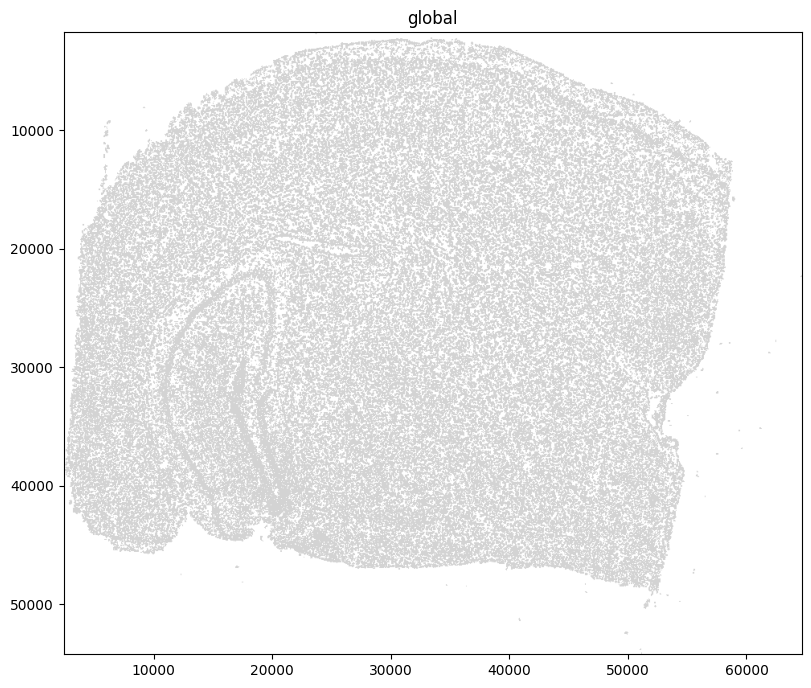

In [15]:
#sdata.pl.render_points("foxf2_s2_r1_transcripts", groups = "Cdh5").pl.show(figsize=(8, 8))
sdata.pl.render_shapes(element=bounds[2]).pl.show(figsize=(8, 8))

In [59]:
# lepto1
# pixel scale
vname = "large_artery1"; dotsize = 1.8
bb_xmin = 52800
bb_ymin = 35800
bb_w = 4300
bb_h = 1200
bb_xmax = bb_xmin + bb_w
bb_ymax = bb_ymin + bb_h

In [60]:
sdata_sub = sdata.query.bounding_box(
    axes=["x", "y"],
    min_coordinate=[bb_xmin, bb_ymin],
    max_coordinate=[bb_xmax, bb_ymax],
    target_coordinate_system="global",
)

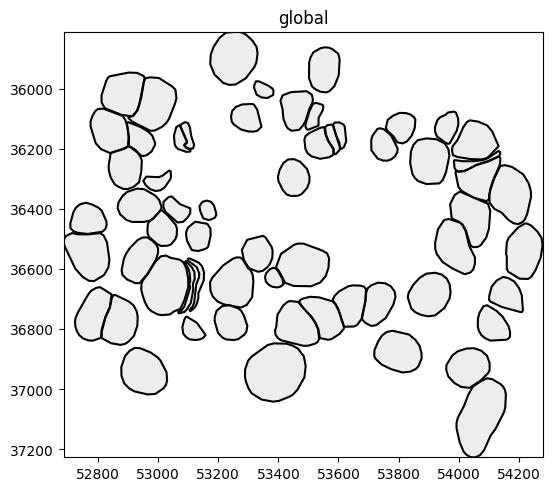

In [61]:
sdata_sub.pl.render_shapes(element=bounds[1],
                              outline_alpha=1.0,
                              fill_alpha=0.4,
                             ).pl.show()

In [62]:
sdata_sub

SpatialData object
├── Images
│     └── 'foxf2_s2_r1_z3': DataTree[cyx] (8, 1200, 4300), (8, 600, 2150), (8, 300, 1075), (8, 150, 537), (8, 75, 269)
├── Points
│     └── 'foxf2_s2_r1_transcripts': DataFrame with shape: (<Delayed>, 9) (2D points)
└── Shapes
      ├── 'boundaries_Baysor_2D_CP1Merlin_075': GeoDataFrame shape: (93, 1) (2D shapes)
      ├── 'boundaries_Baysor_2D_CP1_020': GeoDataFrame shape: (98, 1) (2D shapes)
      ├── 'boundaries_Baysor_2D_CP1_080': GeoDataFrame shape: (88, 1) (2D shapes)
      ├── 'boundaries_Baysor_2D_CP2_020': GeoDataFrame shape: (97, 1) (2D shapes)
      ├── 'boundaries_Baysor_2D_CP2_080': GeoDataFrame shape: (102, 1) (2D shapes)
      ├── 'boundaries_Baysor_2D_nucleus_100': GeoDataFrame shape: (93, 1) (2D shapes)
      ├── 'boundaries_Baysor_3D': GeoDataFrame shape: (101, 1) (2D shapes)
      ├── 'boundaries_Cellpose_1_DAPI_PolyT': GeoDataFrame shape: (60, 1) (2D shapes)
      ├── 'boundaries_Cellpose_1_Merlin': GeoDataFrame shape: (213, 9) (2D shap

INFO     Value for parameter 'color' appears to be a color, using it as such.                                      
INFO     Rasterizing image for faster rendering.                                                                   
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will b

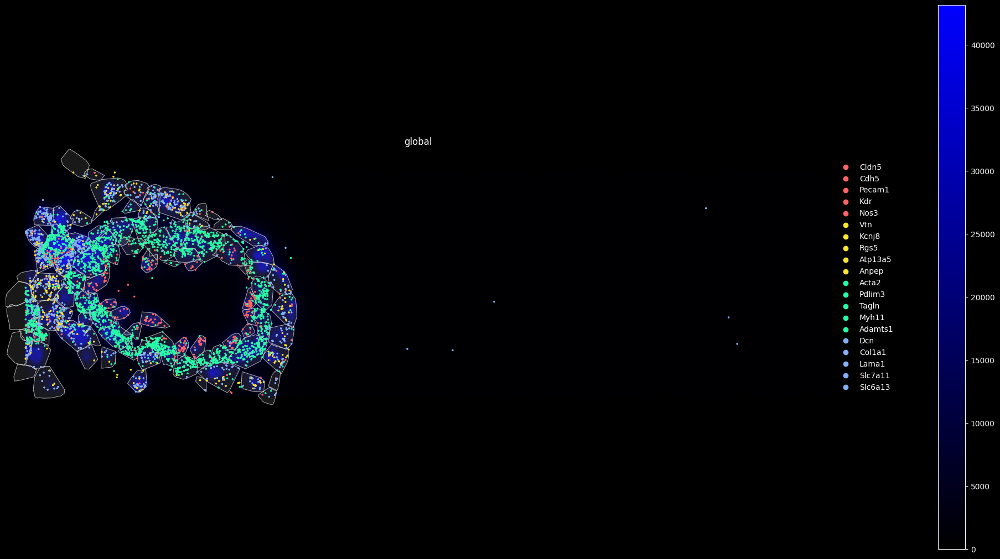

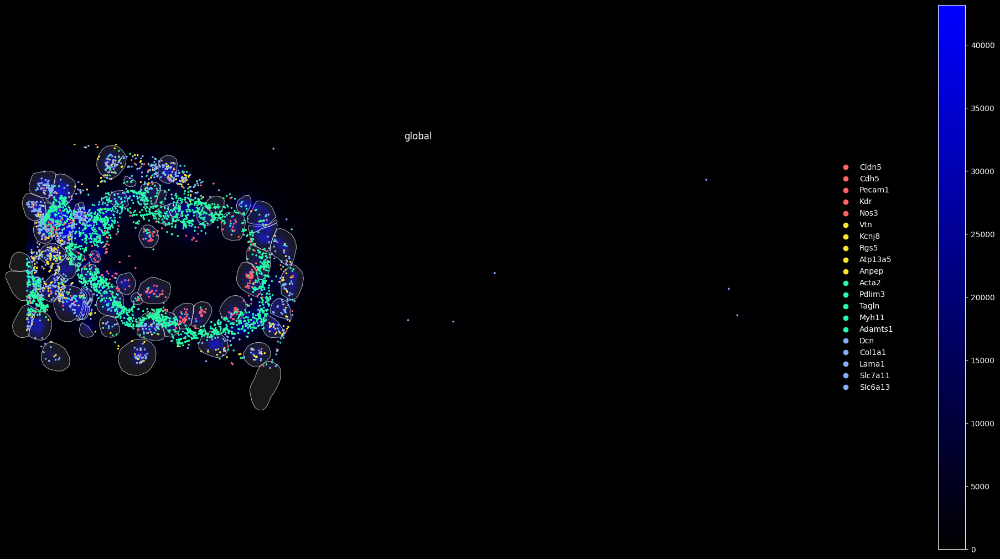

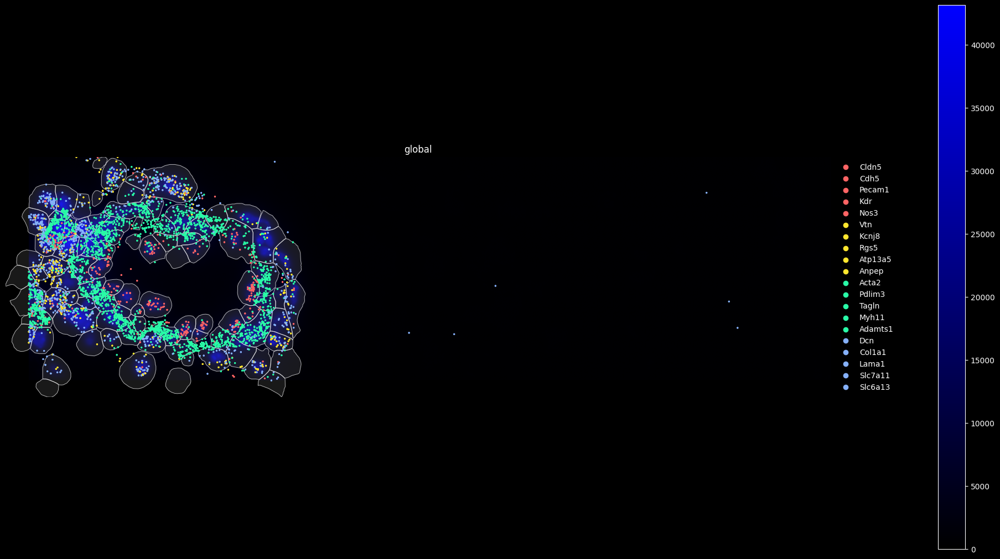

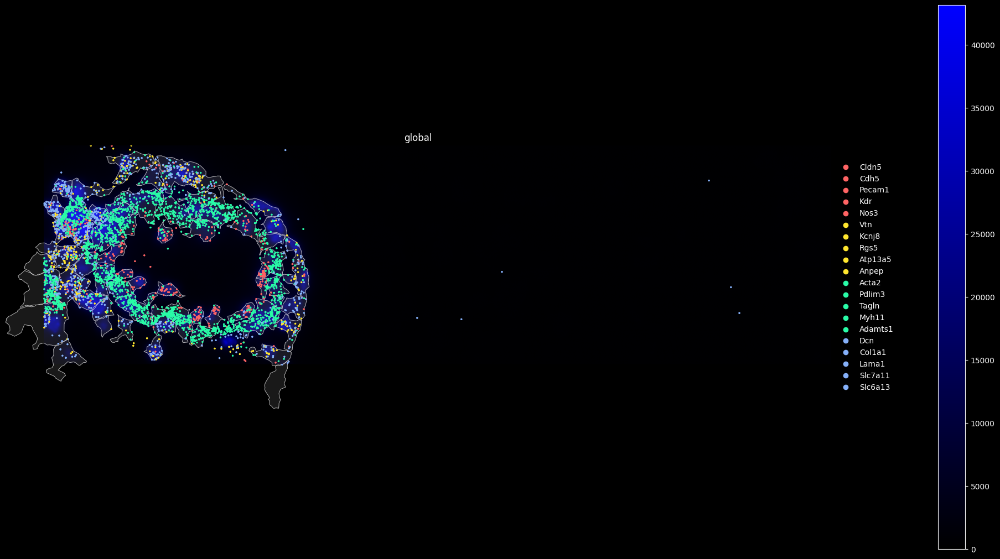

In [63]:
visualize_spatial_data(
    sdata_sub=sdata_sub, bounds=bounds, colors=colors, vname=vname, cell_types_mouse_brain=cell_types_mouse_brain, 
    dotsize=dotsize, data_dir=data_dir, sample_name=sample_name, date_var=date_var
)

In [67]:
# cap1
# pixel scale
vname = "capillaries1"; dotsize = 2.7
bb_xmin = 24200
bb_ymin = 31200
bb_w = 2500
bb_h = 1500
bb_xmax = bb_xmin + bb_w
bb_ymax = bb_ymin + bb_h

In [68]:
sdata_sub = sdata.query.bounding_box(
    axes=["x", "y"],
    min_coordinate=[bb_xmin, bb_ymin],
    max_coordinate=[bb_xmax, bb_ymax],
    target_coordinate_system="global",
)

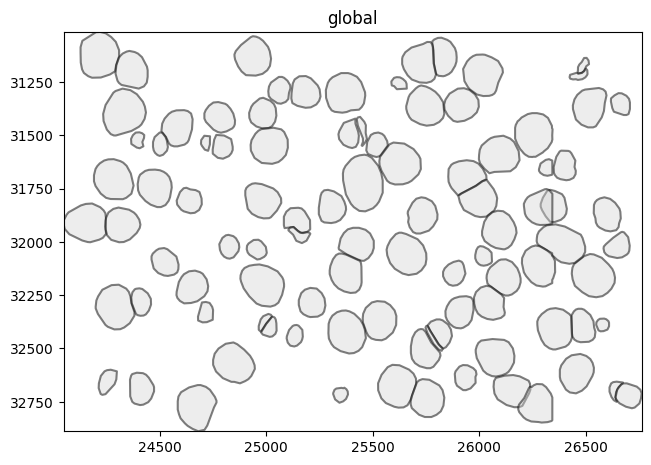

In [69]:
sdata_sub.pl.render_shapes(element=bounds[1],
                              outline_alpha=0.5,
                              fill_alpha=0.4,
                             ).pl.show()

INFO     Value for parameter 'color' appears to be a color, using it as such.                                      
INFO     Rasterizing image for faster rendering.                                                                   
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will b

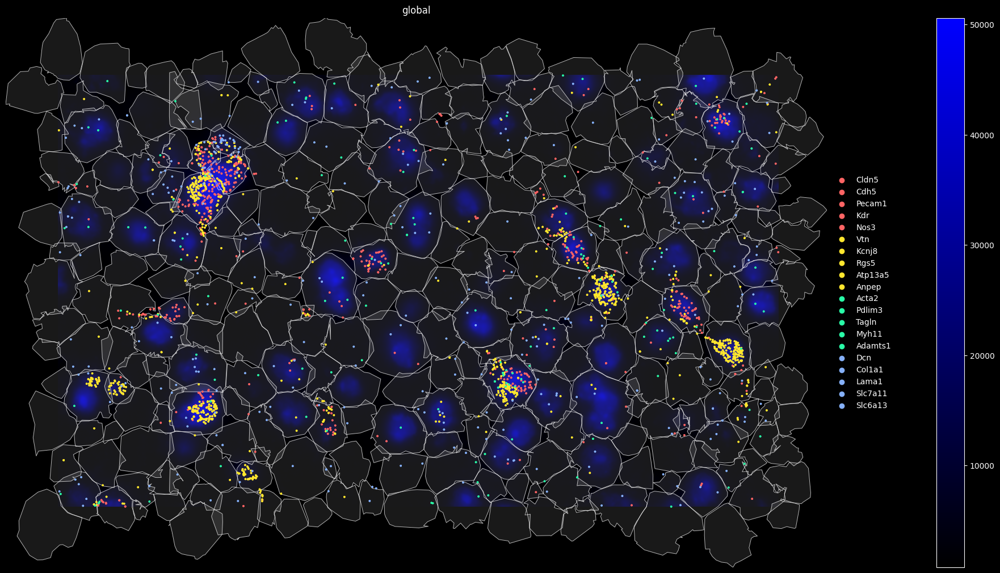

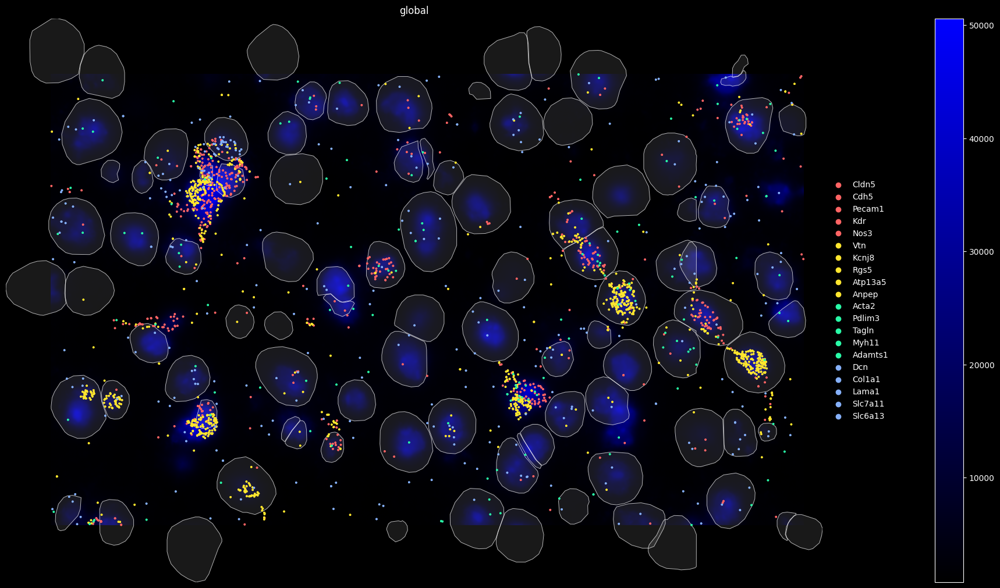

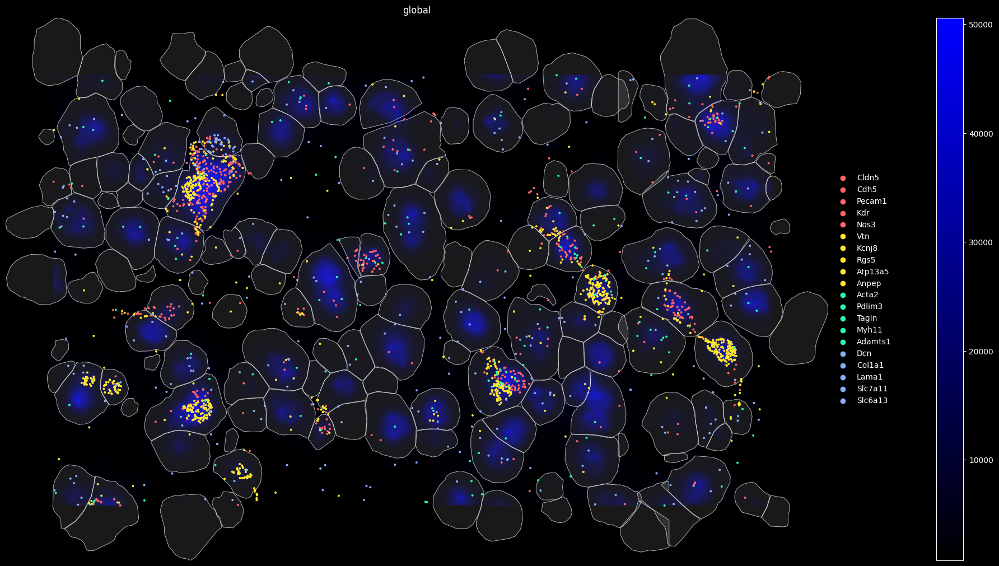

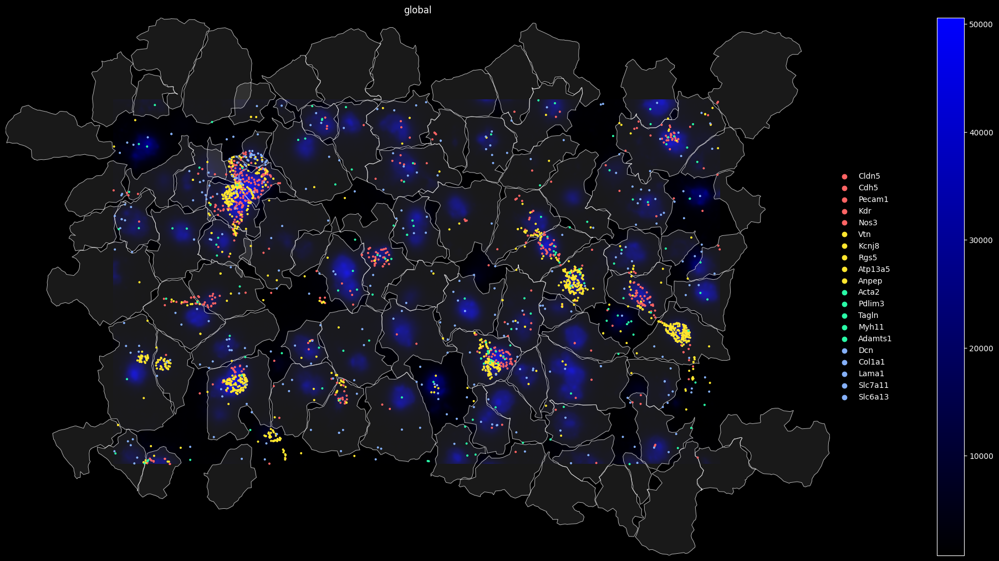

In [70]:
visualize_spatial_data(
    sdata_sub=sdata_sub, bounds=bounds, colors=colors, vname=vname, cell_types_mouse_brain=cell_types_mouse_brain, 
    dotsize=dotsize, data_dir=data_dir, sample_name=sample_name, date_var=date_var
)

In [47]:
# arteriole
# pixel scale
vname = "arteriole1"; dotsize = 0.8
bb_xmin = 55700
bb_ymin = 15300
bb_w = 6800
bb_h = 1250
bb_xmax = bb_xmin + bb_w
bb_ymax = bb_ymin + bb_h

In [17]:
sdata_sub = sdata.query.bounding_box(
    axes=["x", "y"],
    min_coordinate=[bb_xmin, bb_ymin],
    max_coordinate=[bb_xmax, bb_ymax],
    target_coordinate_system="global",
)

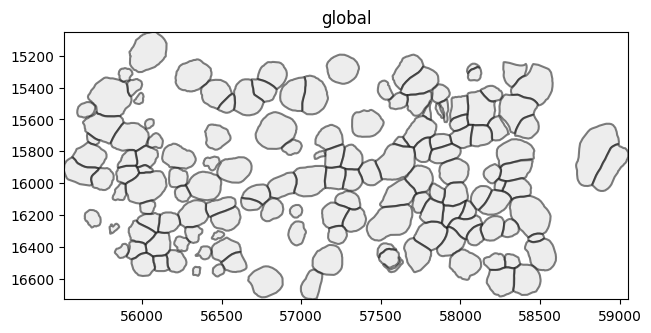

In [18]:
sdata_sub.pl.render_shapes(element=bounds[2],
                              outline_alpha=0.5,
                              fill_alpha=0.4,
                             ).pl.show()

INFO     Value for parameter 'color' appears to be a color, using it as such.                                      
INFO     Rasterizing image for faster rendering.                                                                   
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will b

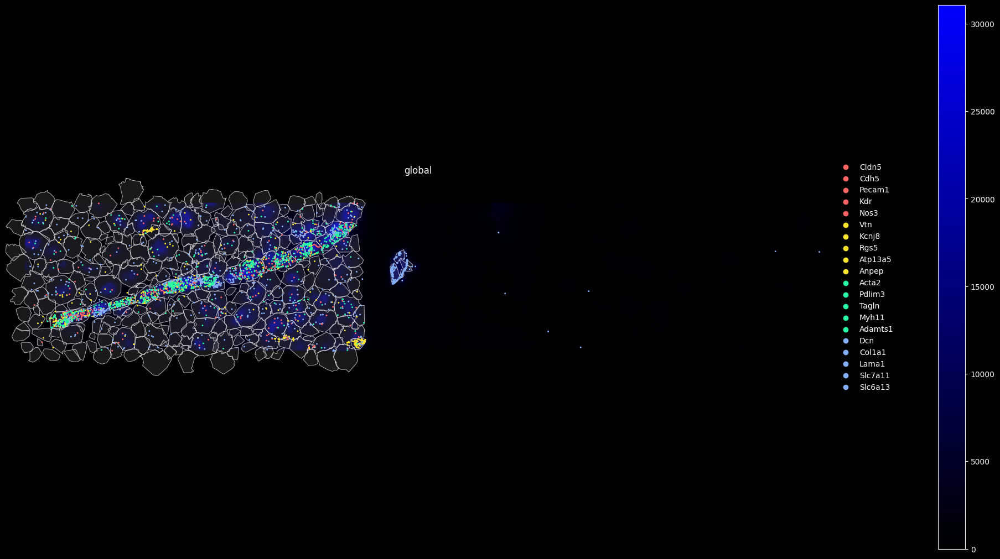

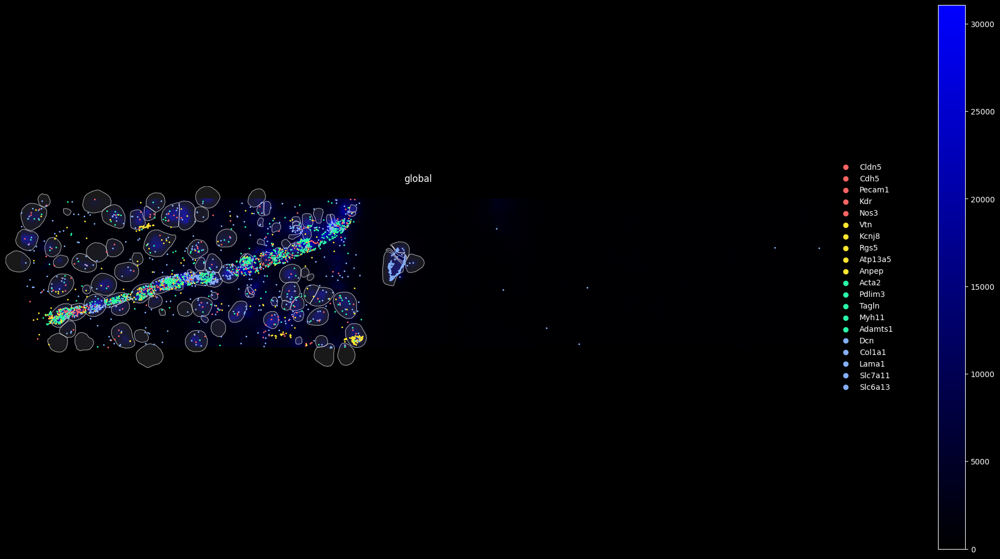

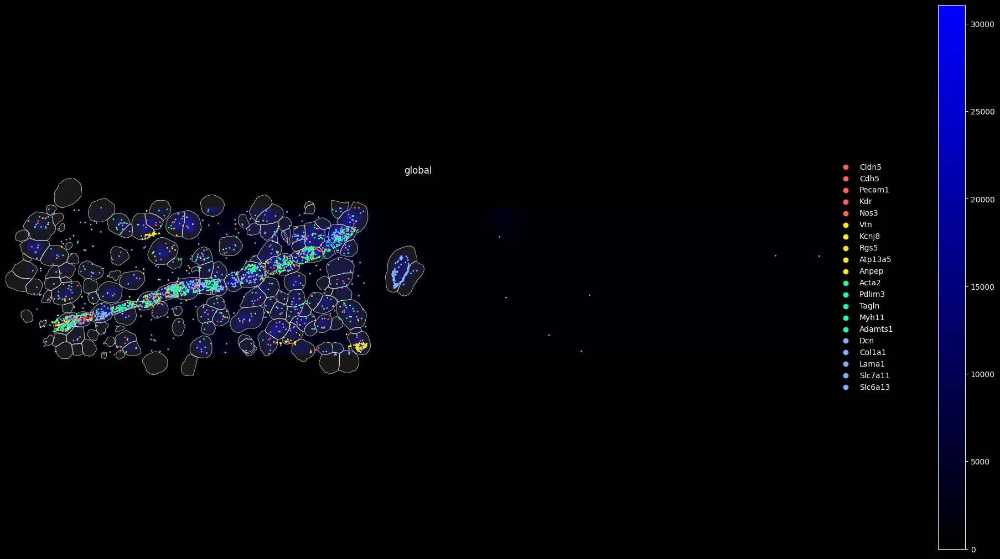

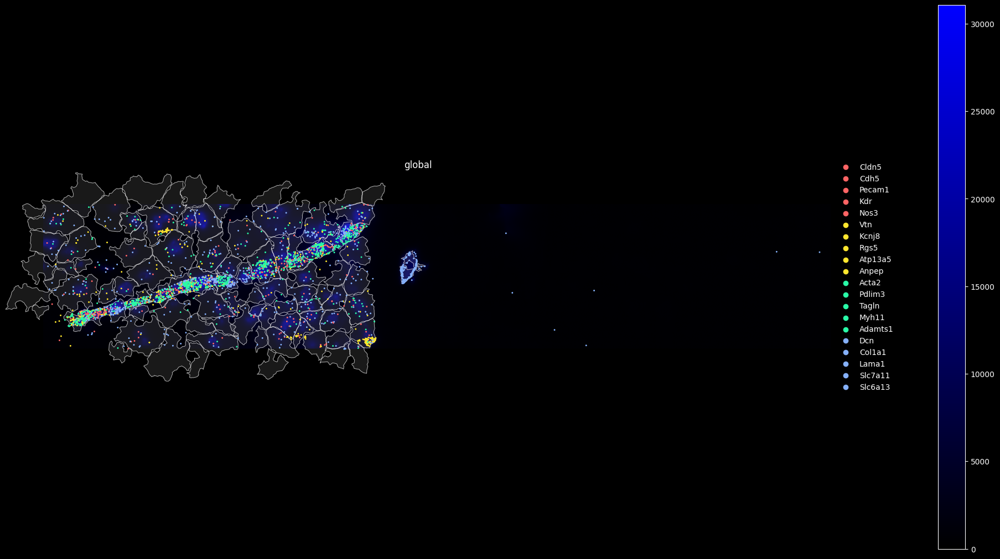

In [54]:
visualize_spatial_data(
    sdata_sub=sdata_sub, bounds=bounds, colors=colors, vname=vname, cell_types_mouse_brain=cell_types_mouse_brain, 
    dotsize=dotsize, data_dir=data_dir, sample_name=sample_name, date_var=date_var
)

In [80]:
# oligos
# pixel scale
vname = "oligos1"; dotsize = 0.8
bb_xmin = 26000
bb_ymin = 20800
bb_w = 2000
bb_h = 1400
bb_xmax = bb_xmin + bb_w
bb_ymax = bb_ymin + bb_h

In [81]:
sdata_sub = sdata.query.bounding_box(
    axes=["x", "y"],
    min_coordinate=[bb_xmin, bb_ymin],
    max_coordinate=[bb_xmax, bb_ymax],
    target_coordinate_system="global",
)

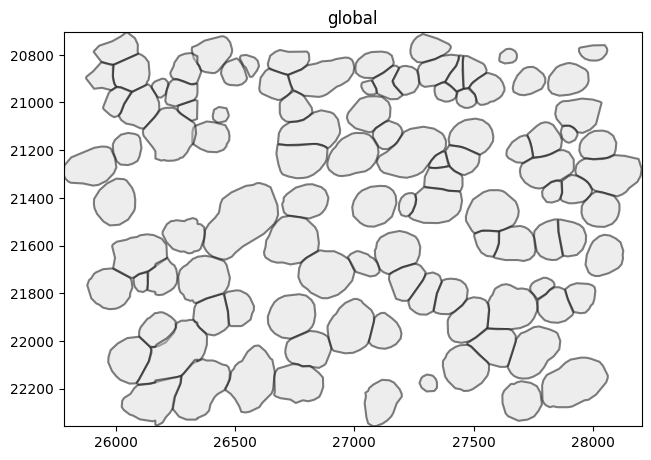

In [82]:
sdata_sub.pl.render_shapes(element=bounds[2],
                              outline_alpha=0.5,
                              fill_alpha=0.4,
                             ).pl.show()

INFO     Value for parameter 'color' appears to be a color, using it as such.                                      
INFO     Rasterizing image for faster rendering.                                                                   
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will b

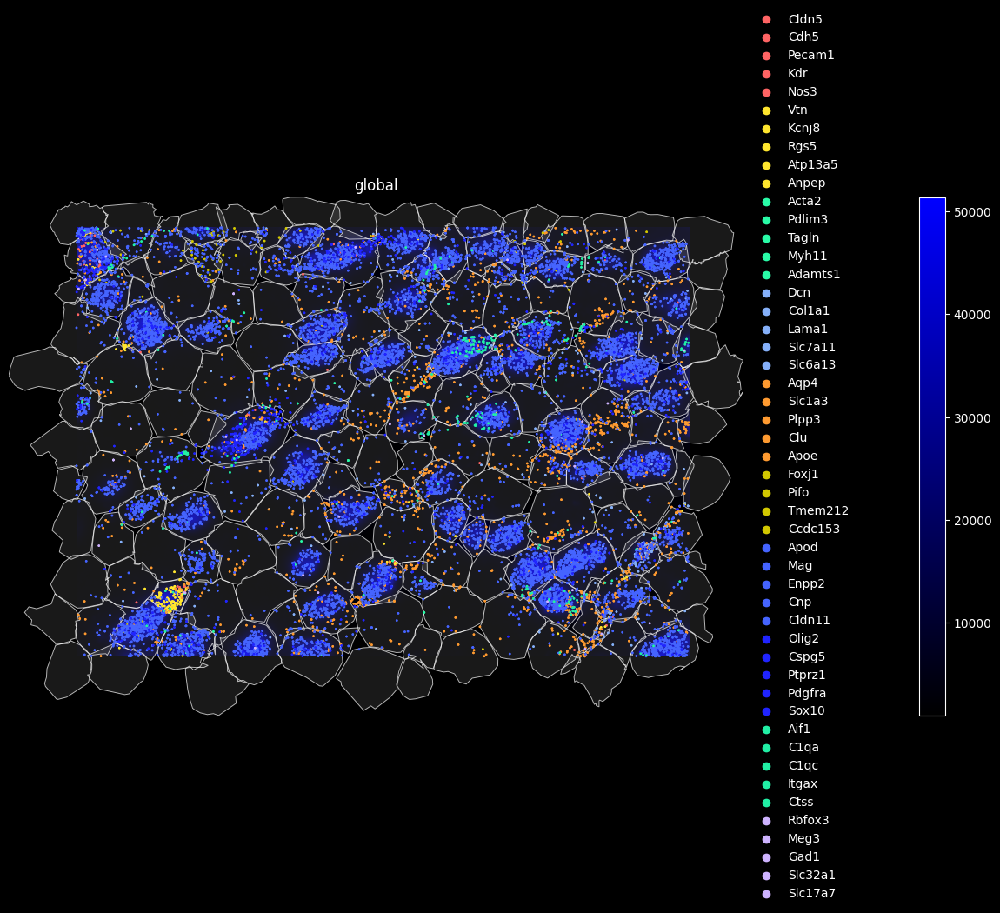

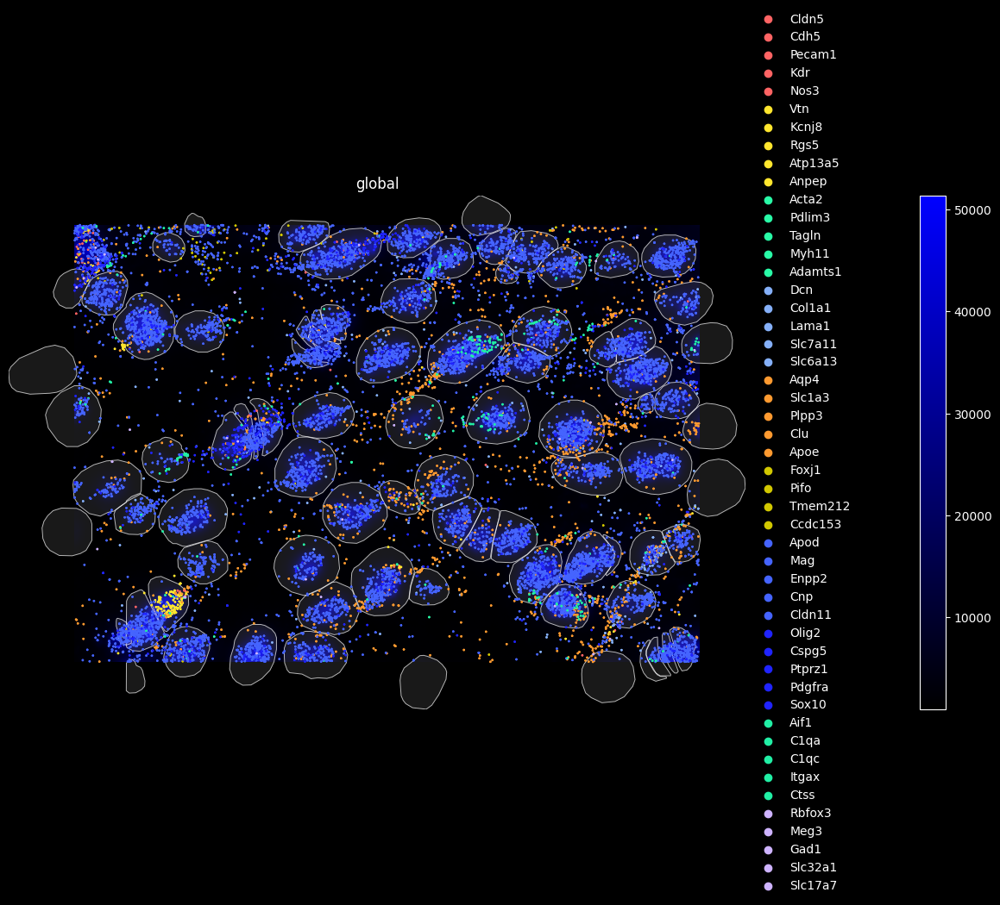

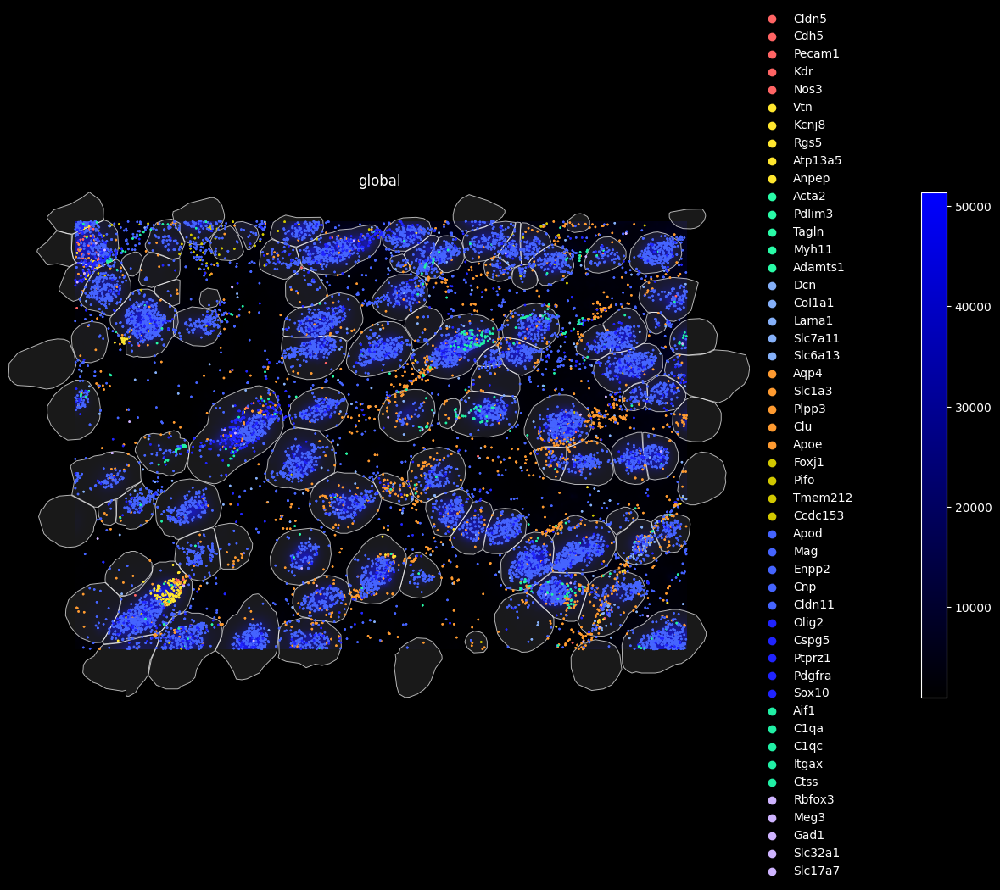

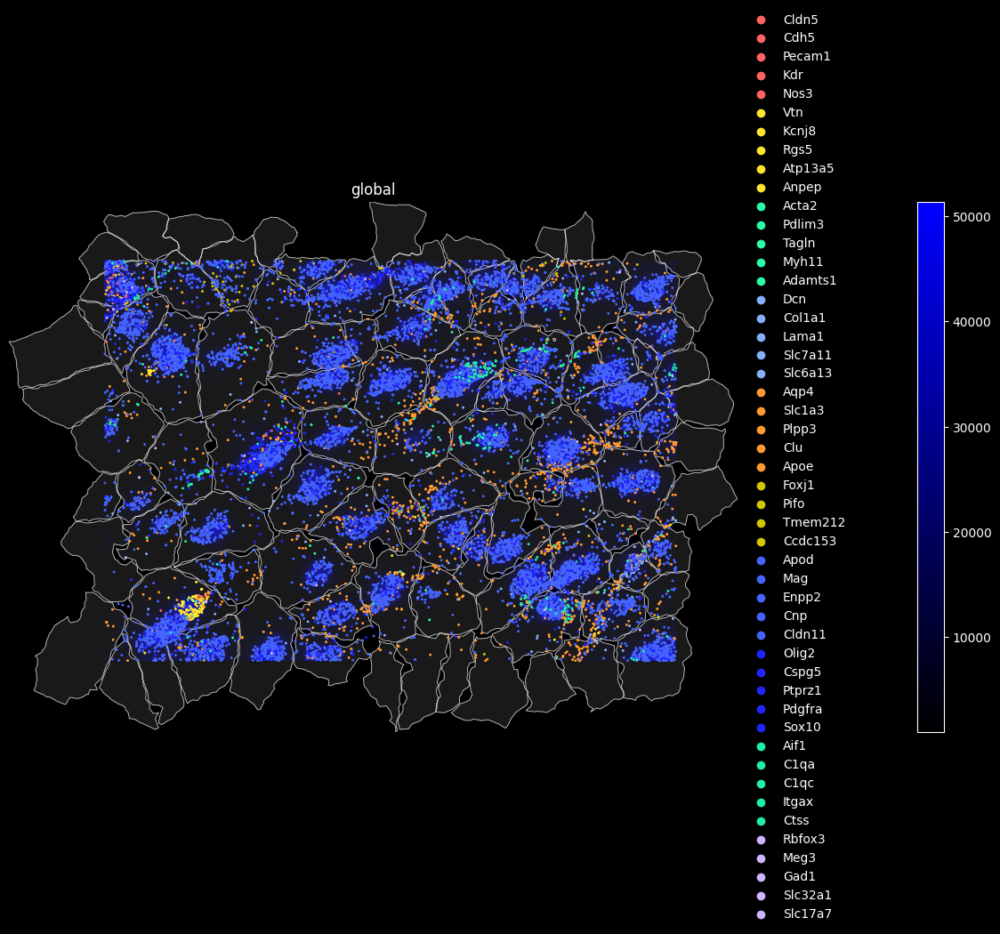

In [86]:
visualize_spatial_data(
    sdata_sub=sdata_sub, bounds=bounds, colors=colors_all, vname=vname, cell_types_mouse_brain=cell_types_mouse_brain_all, 
    dotsize=dotsize, data_dir=data_dir, sample_name=sample_name, date_var=date_var
)

In [120]:
# neurons
# pixel scale
vname = "neurons1"; dotsize = 0.2
bb_xmin = 30100
bb_ymin = 4500
bb_w = 2100
bb_h = 1500
bb_xmax = bb_xmin + bb_w
bb_ymax = bb_ymin + bb_h

In [113]:
sdata_sub = sdata.query.bounding_box(
    axes=["x", "y"],
    min_coordinate=[bb_xmin, bb_ymin],
    max_coordinate=[bb_xmax, bb_ymax],
    target_coordinate_system="global",
)

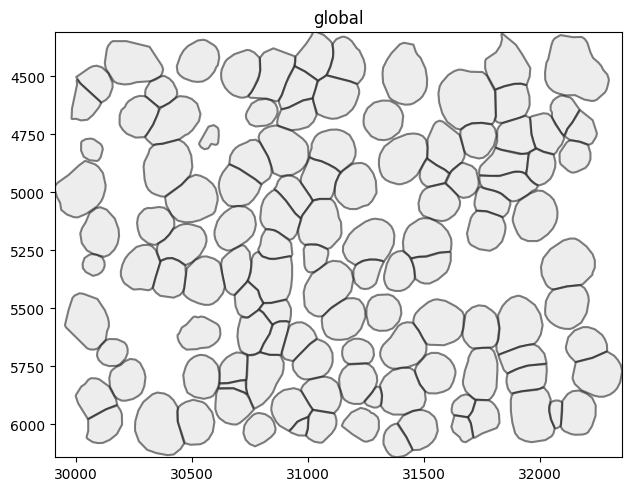

In [114]:
sdata_sub.pl.render_shapes(element=bounds[2],
                              outline_alpha=0.5,
                              fill_alpha=0.4,
                             ).pl.show()

INFO     Value for parameter 'color' appears to be a color, using it as such.                                      
INFO     Rasterizing image for faster rendering.                                                                   
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will b

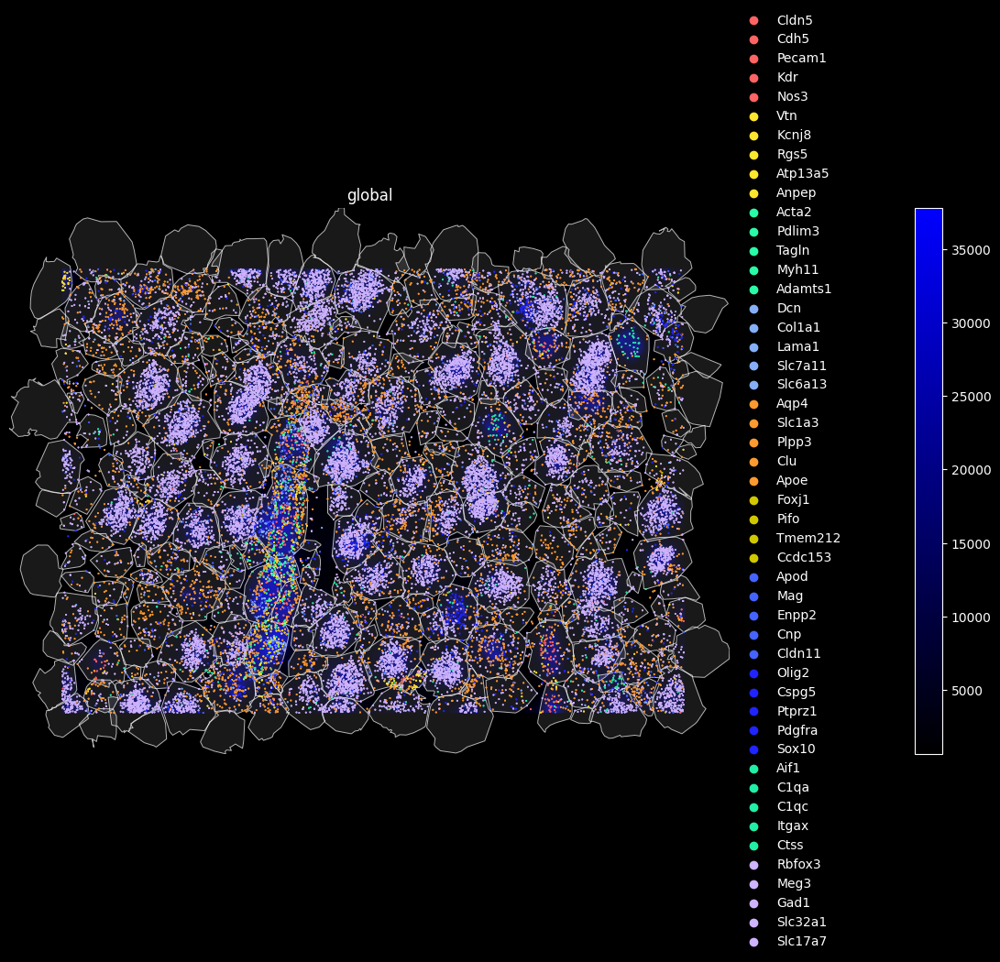

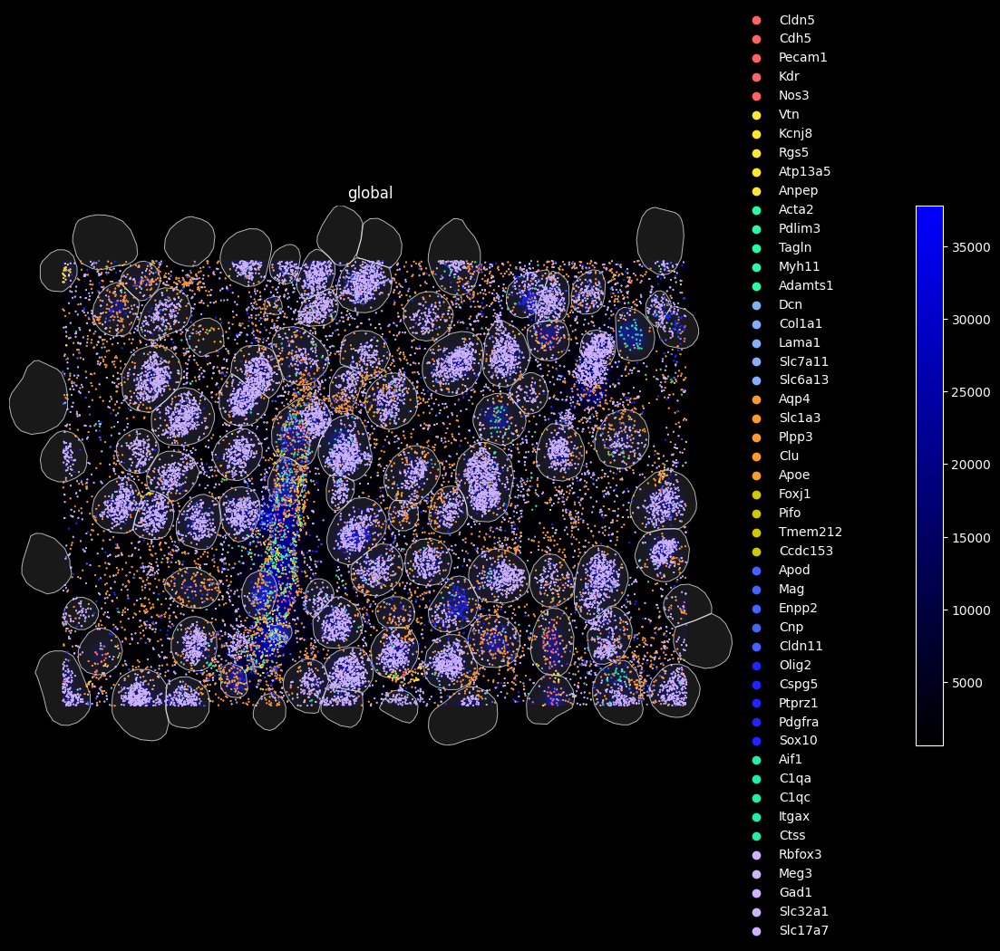

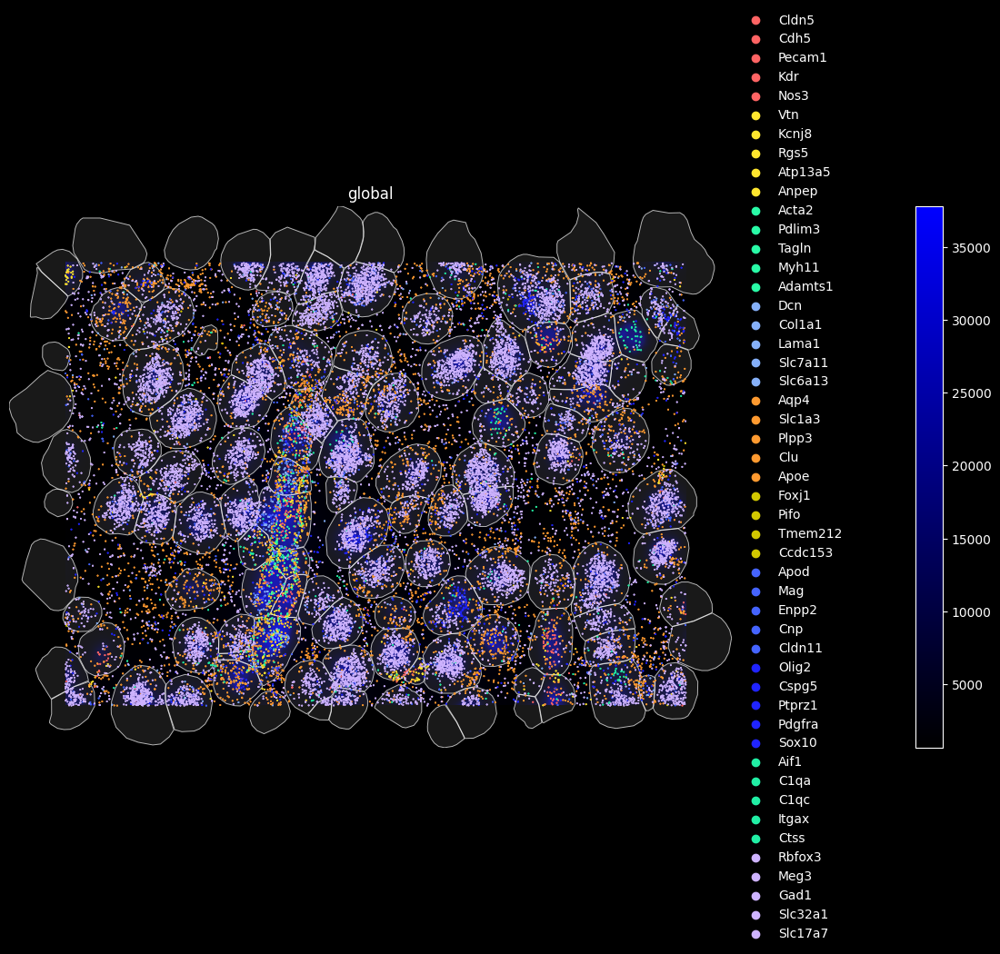

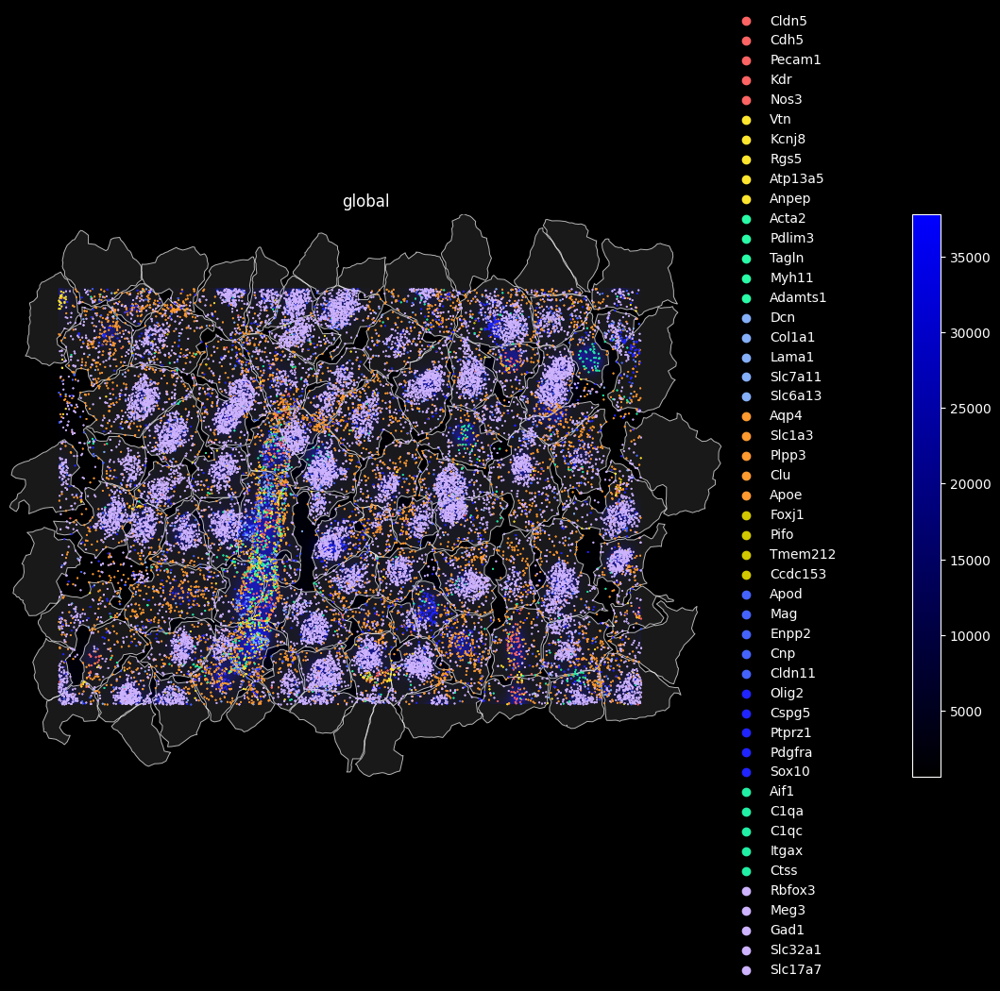

In [121]:
visualize_spatial_data(
    sdata_sub=sdata_sub, bounds=bounds, colors=colors_all, vname=vname, cell_types_mouse_brain=cell_types_mouse_brain_all, 
    dotsize=dotsize, data_dir=data_dir, sample_name=sample_name, date_var=date_var
)